# Gaussian Process
Adapted from https://github.com/jwangjie/Gaussian-Process-Regression-Tutorial

Consider to download this Jupyter Notebook and run locally, or test it with Colab.
<br>

[![Download](https://img.shields.io/badge/Download-jupyter-blue)](https://github.com/ZerojumpLine/ZerojumpLine.github.io/blob/master/teaching/2025-08-08-Pattern%20Recognition/code_2_gp.ipynb)
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1mhYKTOBwE2dqNhHclJHEWDVRdwOfk-OS)

The purpose of this notebook is to understand the basic concept of Gaussian Process.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/gpr_animation_wide.gif?raw=1" width="1000"/>





# Install required packages

In [1]:
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install seaborn
!pip install scikit-learn

## I.	Motivation

First of all, why use Gaussian Process to do regression? Or even, what is regression? Regression is a common machine learning task that can be described as Given some observed data points (training dataset), finding a function that represents the dataset as close as possible, then using the function to make predictions at new data points. Regression can be conducted with polynomials, and it's common there is more than one possible function that fits the observed data. Besides getting predictions by the function, we also want to know how certain these predictions are. Moreover, quantifying uncertainty is super valuable to achieve an efficient learning process. The areas with the least certainty should be explored more.

In a word, GP can be used to make predictions at new data points and can tell us how certain these predictions are.

<div id="image-table">
    <table>
	    <tr>
    	    <td style="padding:10px">
        	    <img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/regression1.png?raw=1" width="400"/> [2]
      	    </td>
            <td style="padding:10px">
            	<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/regression2.png?raw=1" width="550"/>
            </td>
        </tr>
    </table>
</div>

## II. Basics

### A.	Gaussian (Normal) Distribution  

Let's talk about Gaussian.

A random variable $X$ is said to be normally distributed with mean $\mu$ and variance $\sigma^2$ if its probability density function (PDF) is
$$ P_X(x) = \frac{1}{\sqrt{2 \pi} \sigma} exp{\left(-\frac{{\left(x - \mu \right)}^{2}}{2 \sigma^{2}}\right)}$$

Here, $X$ represents random variables and $x$ is the real argument. The Gaussian or Normal distribution of $X$ is usually represented by $ P(x) ~ \sim\mathcal{N}(\mu, \sigma^2)$.

A $1-D$ Gaussian PDF is plotted below. We generate `n` number random sample points from a $1-D$ Gaussian distribution on `x` axis.

In [2]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [3]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.format'] = 'pdf'

/var/folders/nl/7_2jcxd12wb5z06jvsj1v4240000gn/T/ipykernel_52251/1811352357.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(f_random[i], hist=True, rug=True, fit=norm, kde=False, color="r", vertical=False)


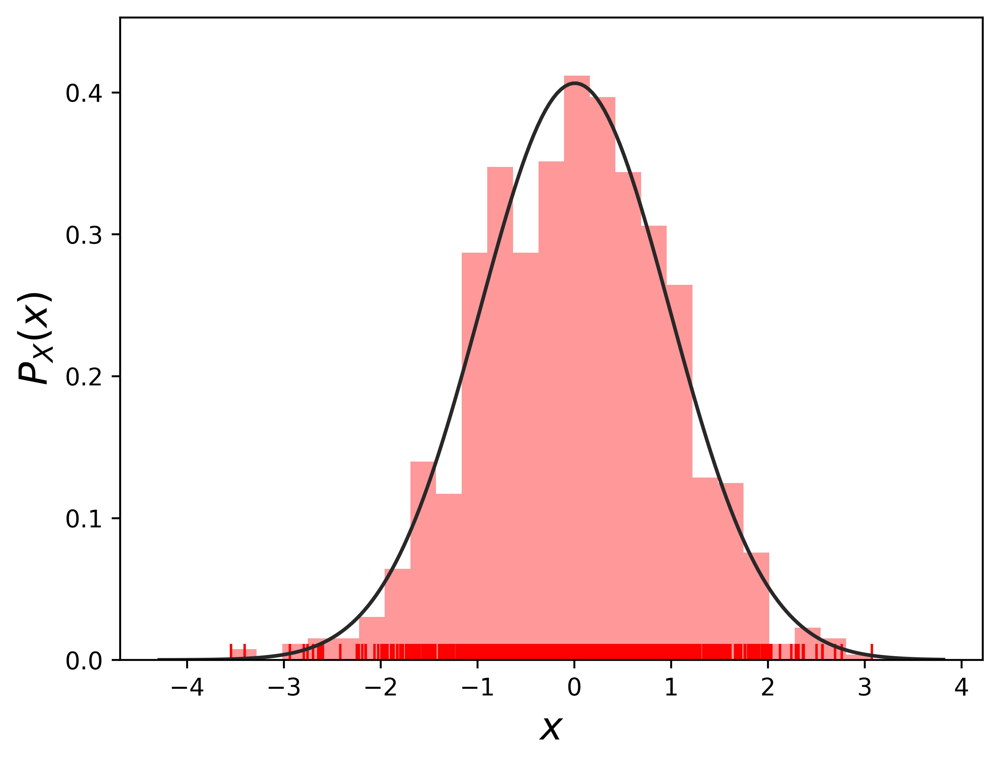

In [4]:
from scipy.stats import norm

# Plot 1-D gaussian
n = 1         # n number of independent 1-D gaussian
m= 1000       # m points in 1-D gaussian
f_random = np.random.normal(size=(n, m))
# more information about 'size': https://www.sharpsightlabs.com/blog/numpy-random-normal/
#print(f_random.shape)

for i in range(n):
    #sns.distplot(f_random[i], hist=True, rug=True, vertical=True, color="orange")
    sns.distplot(f_random[i], hist=True, rug=True, fit=norm, kde=False, color="r", vertical=False)

#plt.title('1000 random samples by a 1-D Gaussian')

plt.xlabel(r'$x$', fontsize = 16)
plt.ylabel(r'$P_X(x)$', fontsize = 16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig('1d_random')

/var/folders/nl/7_2jcxd12wb5z06jvsj1v4240000gn/T/ipykernel_52251/3710904256.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(f_random[i], hist=True, rug=True)


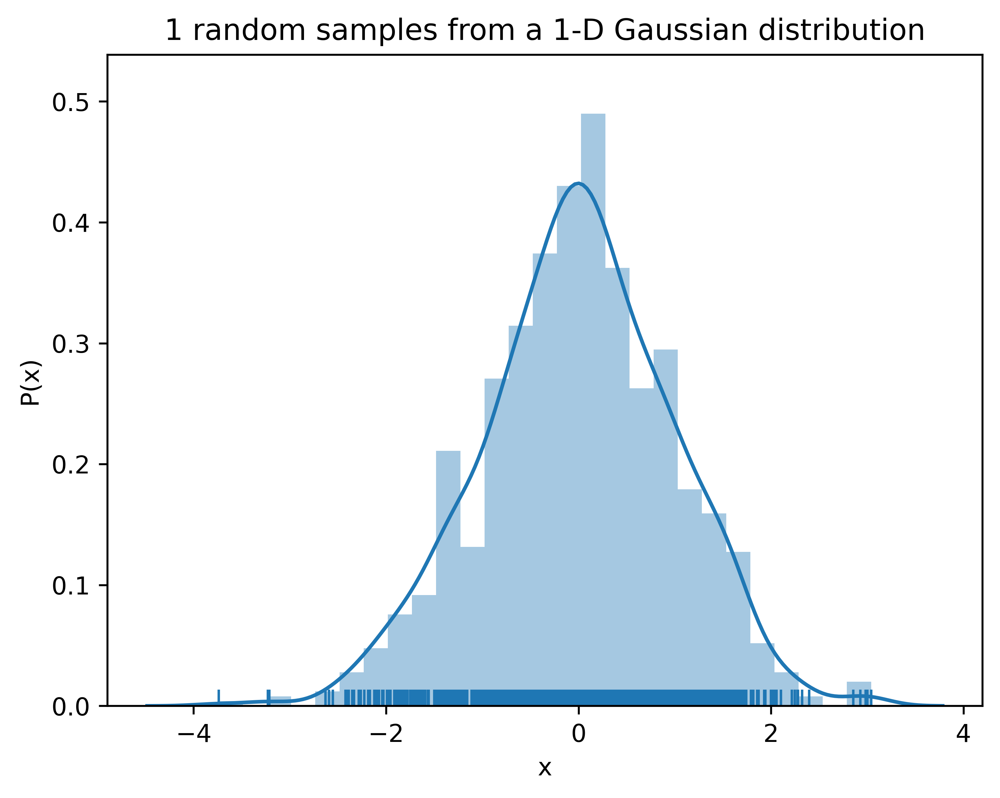

In [5]:
# Plot 1-D gaussian
n = 1         # n number of independent 1-D gaussian
m= 1000       # m points in 1-D gaussian
f_random = np.random.normal(size=(n, m))
# more information about 'size': https://www.sharpsightlabs.com/blog/numpy-random-normal/
#print(f_random.shape)

for i in range(n):
    #sns.distplot(f_random[i], hist=True, rug=True, vertical=True, color="orange")
    sns.distplot(f_random[i], hist=True, rug=True)

plt.title('1 random samples from a 1-D Gaussian distribution')
plt.xlabel('x')
plt.ylabel('P(x)')
plt.show()

We generated data points that follow the normal distribution. On the other hand, we can model data points, assume these points are Gaussian, model as a function, and do regression using it. As shown above, a kernel density and histogram of the generated points were estimated. The kernel density estimation looks a normal distribution due to there are plenty `(m=1000)` observation points to get this Gaussian looking PDF. In regression, even we don't have that many observation data, we can model the data as a function that follows a normal distribution if we assume a Gaussian prior.

We have a random generated dataset in $1-D$ $\mathbf{D}=[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$. We sampled the generated dataset and got a $1-D$Gaussian bell curve.

Now, if we project all points $[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$ on the x-axis to another **space**. In this space, We treat all points $[x^{(1)}, x^{(2)}, \ldots, x^{(m)}]$ as a vector $X_1$, and plot $X_1$ on the new $X$ axis at $X = 0$.

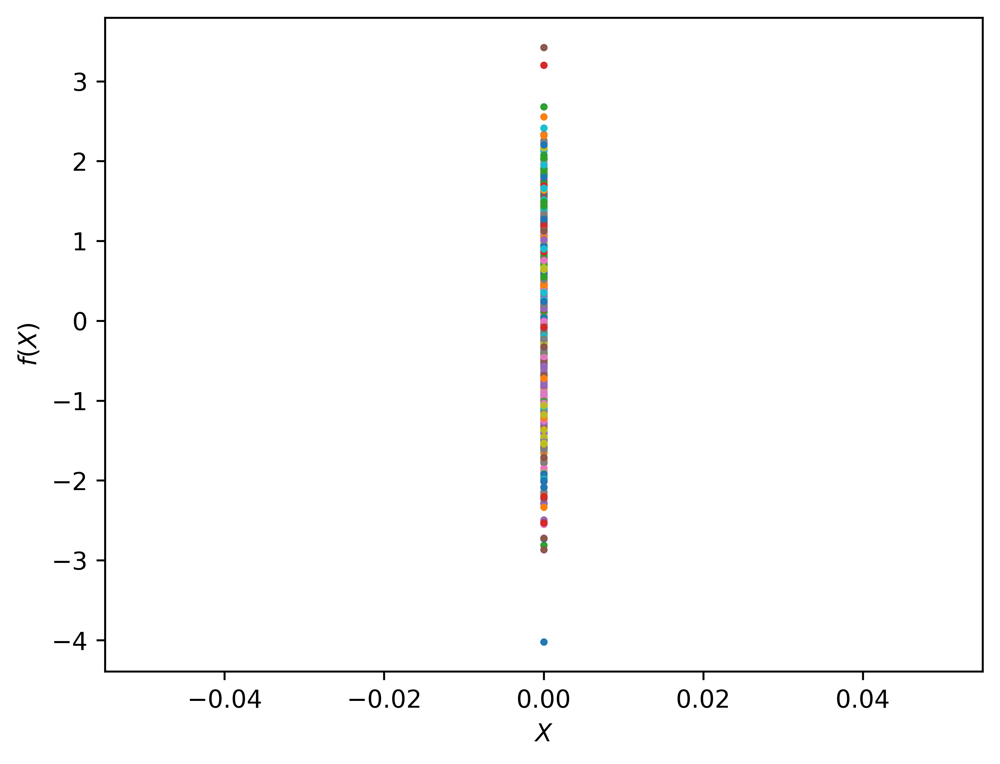

In [6]:
n = 1         # n number of independent 1-D gaussian
m= 1000       # m points in 1-D gaussian
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, 'o', linewidth=1, markersize=1, markeredgewidth=2)
plt.xlabel('$X$')
plt.ylabel('$f(X)$')
plt.show()

It's clear that the vector $X_1$ is Gaussian. It looks like we did nothing but vertically plot the vector points $X_1$.
Next, we can plot multiple independent Gaussian in the $X-Y$ coordinates. For example, put vector $X_1$ at at $X = 0$ and another vector $X_2$ at at $X = 1$.

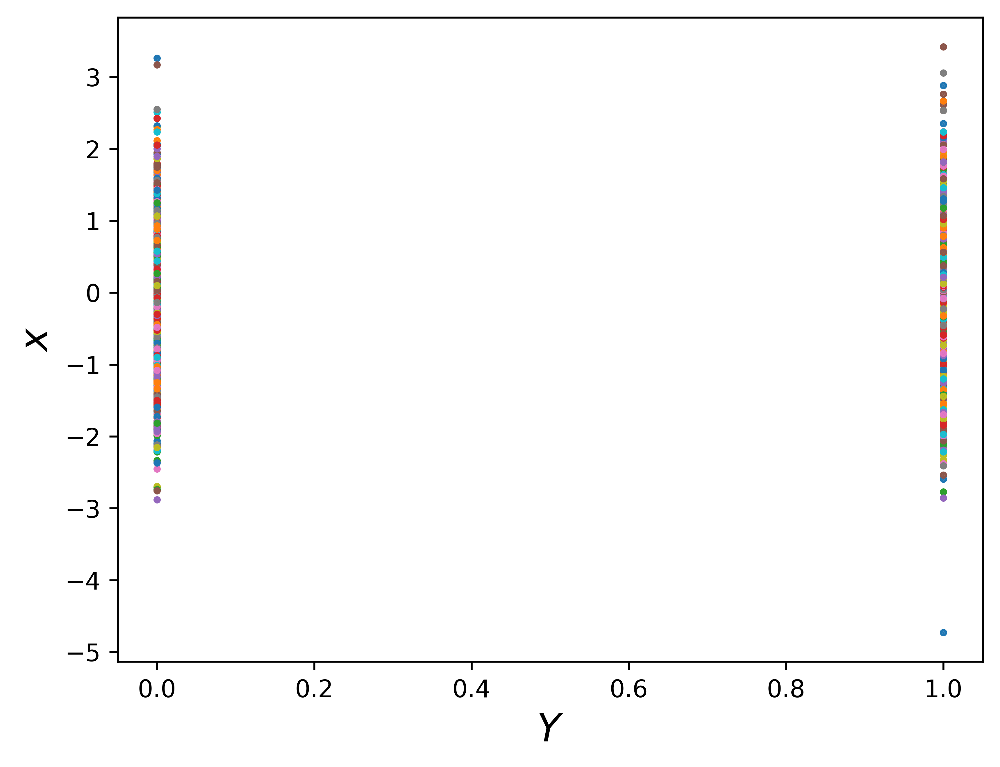

In [7]:
n = 2
m = 1000
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, 'o', linewidth=1, markersize=1, markeredgewidth=2)

plt.xlabel(r'$Y$', fontsize = 16)
plt.ylabel(r'$x$', fontsize = 16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig('2gaussian')


Keep in mind that both vecotr $X_1$ and $X_2$ are Gaussian.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2gaussian.png?raw=1" width="500"/>

Let's do something interesting. Let's connect points of $X_1$ and $X_2$ by lines. For now, we only generate 10 random points for $X_1$ and $X_2$, and then join them up as 10 lines. Keep in mind, these random generated 10 points are Gaussian.

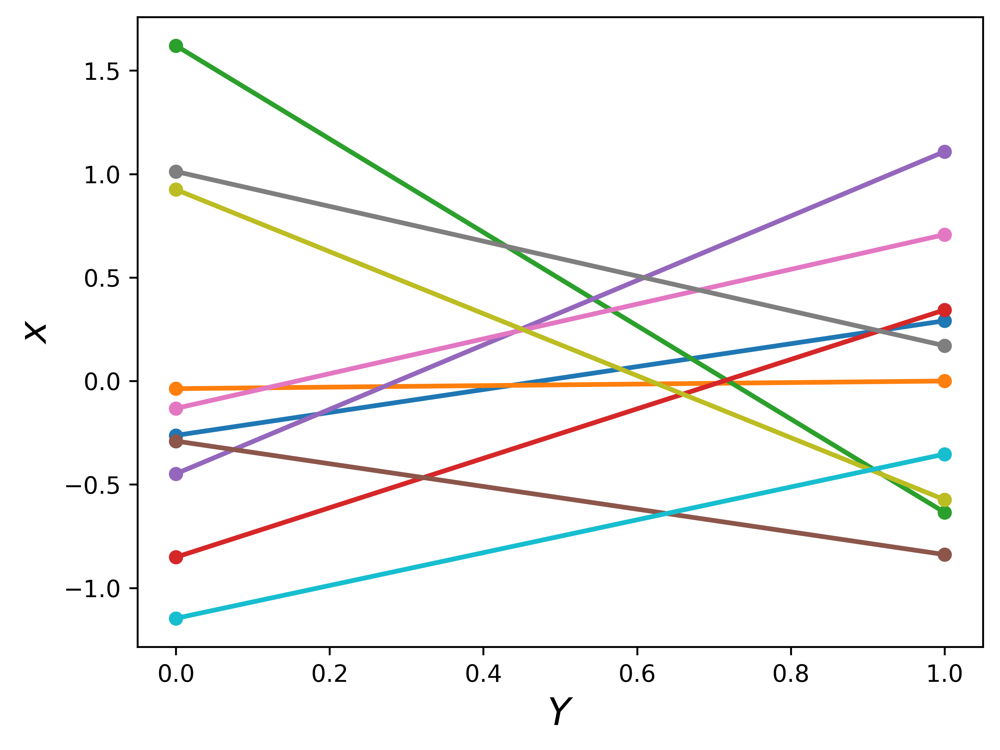

In [8]:
n = 2
m = 10
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, '-o', linewidth=2, markersize=4, markeredgewidth=2)
plt.xlabel(r'$Y$', fontsize = 16)
plt.ylabel(r'$x$', fontsize = 16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig('random_x1_x2')

Going back to think about regression. These lines look like **functions** for each pair of points. On the other hand, the plot also looks like we are sampling the region $[0, 1]$ with 10 linear functions even there are only two points on each line. In the sampling perspective, the $[0, 1]$ domain is our region of interest, i.e. the specific region we do our regression. This sampling looks even more clear if we generate more independent Gaussian and connecting points in order by lines.

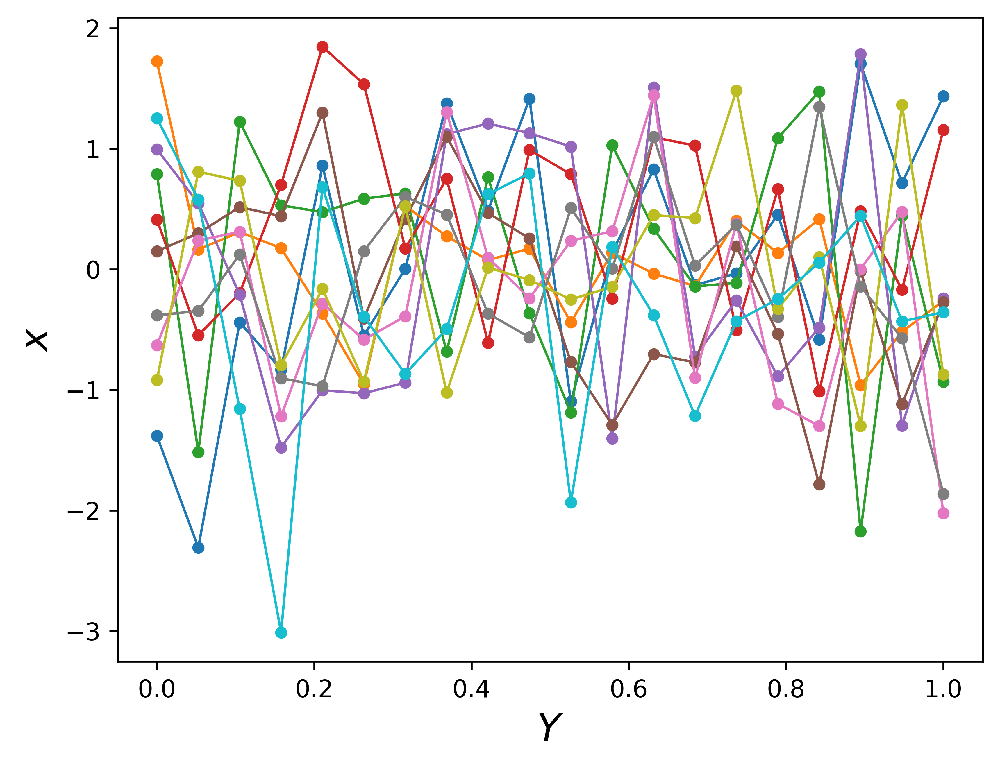

In [9]:
n = 20
m = 10
f_random = np.random.normal(size=(n, m))

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

plt.clf()
plt.plot(Xshow, f_random, '-o', linewidth=1, markersize=3, markeredgewidth=2)

plt.xlabel(r'$Y$', fontsize = 16)
plt.ylabel(r'$x$', fontsize = 16)

# plt.show()
# plt.savefig('1d_random.png', bbox_inches='tight', dpi=600)
plt.savefig('random_x1_x20')

Wait for a second, what we are trying to do by connecting random generated independent Gaussian points? Even these lines look like functions, but they are too noisy. If $X$ is our input space, these functions are meaningless for the regression task. We can do no prediction by using these functions. The functions should be smoother, meaning input points that are close to each other should have similar values of the function.

Thus, functions by connecting independent Gaussian are not proper for regression, we need Gaussians that correlated to each other. How to describe joint Gaussian? Multivariable Gaussian.  

### B. Multivariate Normal Distribution (MVN)

The $2-D$ gaussian can be visualized as a 3D bell curve with the heights representing probability density. The $P(x_1, x_2)$ is the [joint probability distribution](https://en.wikipedia.org/wiki/Joint_probability_distribution#Density_function_or_mass_function).

<div id="image-table">
    <table>
	    <tr>
    	    <td style="padding:10px">
        	    <img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2d_gaussian3D_0.8.png?raw=1" width="400"/>
      	    </td>
            <td style="padding:10px">
            	<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2d_gaussian_0.8.png?raw=1" width="380"/>
            </td>
        </tr>
    </table>
</div>

Goes to [Appendix A](#Appendix-A) if you want to generate image on the left.

Formally, multivariate Gaussian is expressed as [4]

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/mul_var_gaussian.png?raw=1" width="400"/>

The `mean vector` $\mu$ is a 2d vector $(\mu_1, \mu_2)$, which are independent mean of each variable $x_1$ and $x_2$.

The covariance matrix of $2-D$ Gaussian is $\begin{pmatrix} \sigma^2_1 & \sigma_{12} \\ \sigma_{21} & \sigma^2_2 \end{pmatrix}$. The diagonal terms are independent variances of each variable, $x_1$ and $x_2$. The offdiagonal terms represents correlations between the two variables. A correlation component represents how much one variable is related to another variable.

A $2-D$ Gaussian can be expressed as
$$ \begin{pmatrix} x_1 \\ x_2 \end{pmatrix} \sim \mathcal{N}\left(\begin{pmatrix} \mu1 \\ \mu_2 \end{pmatrix}, \begin{pmatrix} \sigma^2_1 & \sigma_{12} \\ \sigma_{21} & \sigma^2_2 \end{pmatrix}\right) \sim \mathcal{N}(\mu, \Sigma)$$

When we have an $N-D$ Gaussian, the covariance matrix $\Sigma$ is $N×N$ and its $(i,j)$ element is $\Sigma_{ij}=cov(y_i,y_j)$. The $\Sigma$ is a symmetric matrix and stores the pairwise covariances of all the jointly modeled random variables.

Play around with the covariance matrix to see the correlations between the two Gaussians.

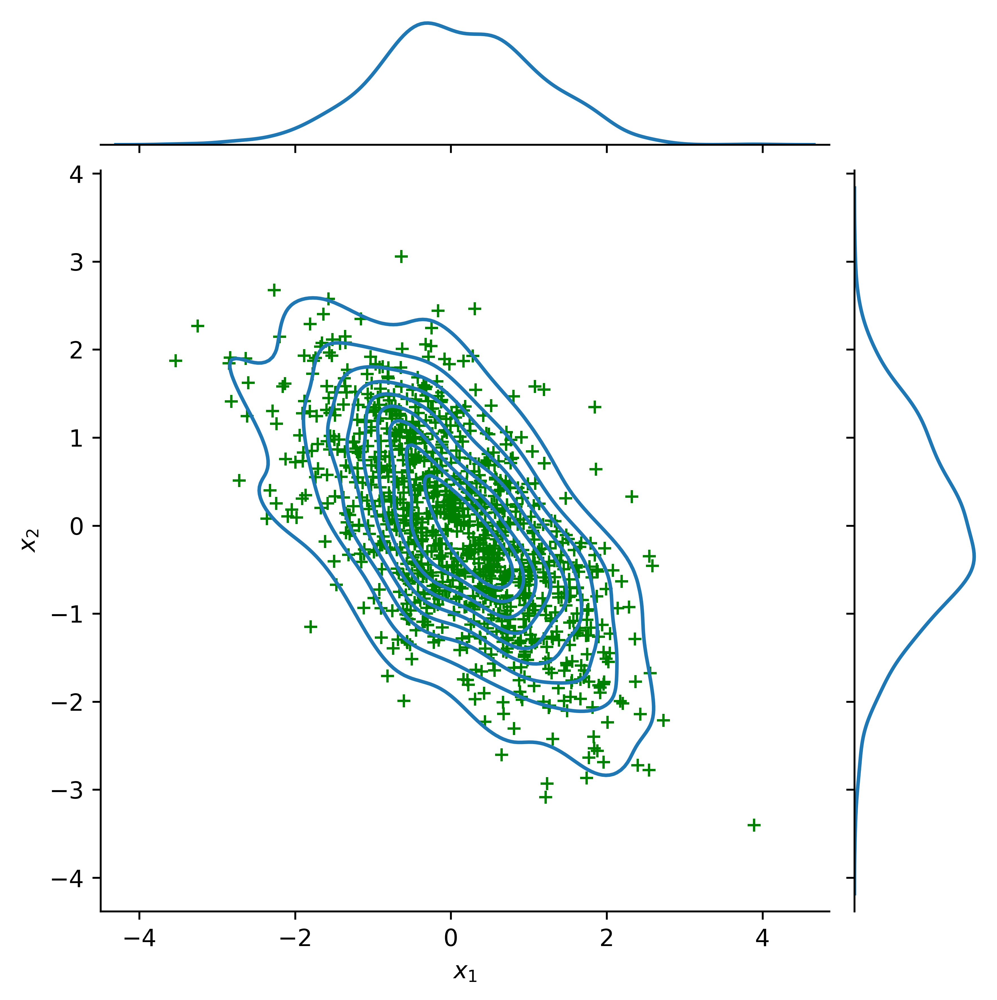

In [10]:
import pandas as pd
import seaborn as sns

mean, cov = [0., 0.], [(1., -0.6), (-0.6, 1.)]
data = np.random.multivariate_normal(mean, cov, 1000)
df = pd.DataFrame(data, columns=["x1", "x2"])

# Updated parameter names to current seaborn syntax
g = sns.jointplot(x="x1", y="x2", data=df, kind="kde")

g.plot_joint(plt.scatter, c="g", s=30, linewidth=1, marker="+")
g.set_axis_labels("$x_1$", "$x_2$")  # Changed to subscript notation

plt.show()

### C. Kernels

We want to smooth the sampling functions by defining the covariance functions. Considering the fact that when two vectors are similar, their dot product output value is high. It is very clear to see this in the dot product equation $A\,B = AB\,cos\theta$, where $\theta$ is the angle between two vectors. If an algorithm is defined solely in terms of inner products in input space then it can be lifted into feature space by replacing occurrences of those inner products by $k(x,\ x^\prime)$; we call $k(\bullet,\bullet)$ a kernel function.

A popular covariance function (aka kernel function) is squared exponential kernal, also called the radial basis function (RBF) kernel or Gaussian kernel, defined as

$$ cov(x_i, x_j)=\exp\left(-~\frac{(x_i-x_j)^2}{2}\right)$$

Let's re-plot 20 independent Gaussian and connecting points in order by lines. Instead of generating 20 independent Gaussian before, we do the plot of a $20-D$ Gaussian with a identity convariance matrix.

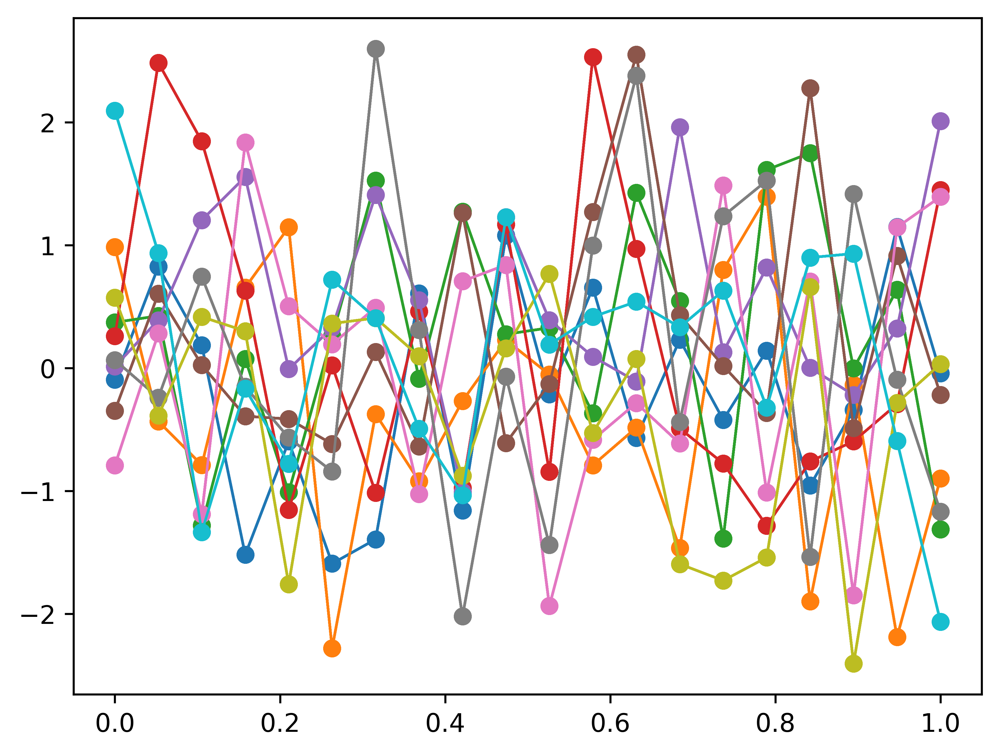

In [11]:
n = 20
m = 10

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, cov, m).T

plt.clf()

#plt.plot(Xshow, f_prior, '-o')
Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

for i in range(m):
    plt.plot(Xshow, f_prior, '-o', linewidth=1)

# plt.title('10 samples of the 20-D gaussian prior')
# plt.show()
plt.savefig('20d_gaussian_prior')

We got exactly the same plot as expected. Now let's kernelizing our funcitons by use the RBF as our convariace.

In [12]:
# Define the kernel
def kernel(a, b):
    sqdist = np.sum(a**2,axis=1).reshape(-1,1) + np.sum(b**2,1) - 2*np.dot(a, b.T)
    # np.sum( ,axis=1) means adding all elements columnly; .reshap(-1, 1) add one dimension to make (n,) become (n,1)
    return np.exp(-.5 * sqdist)

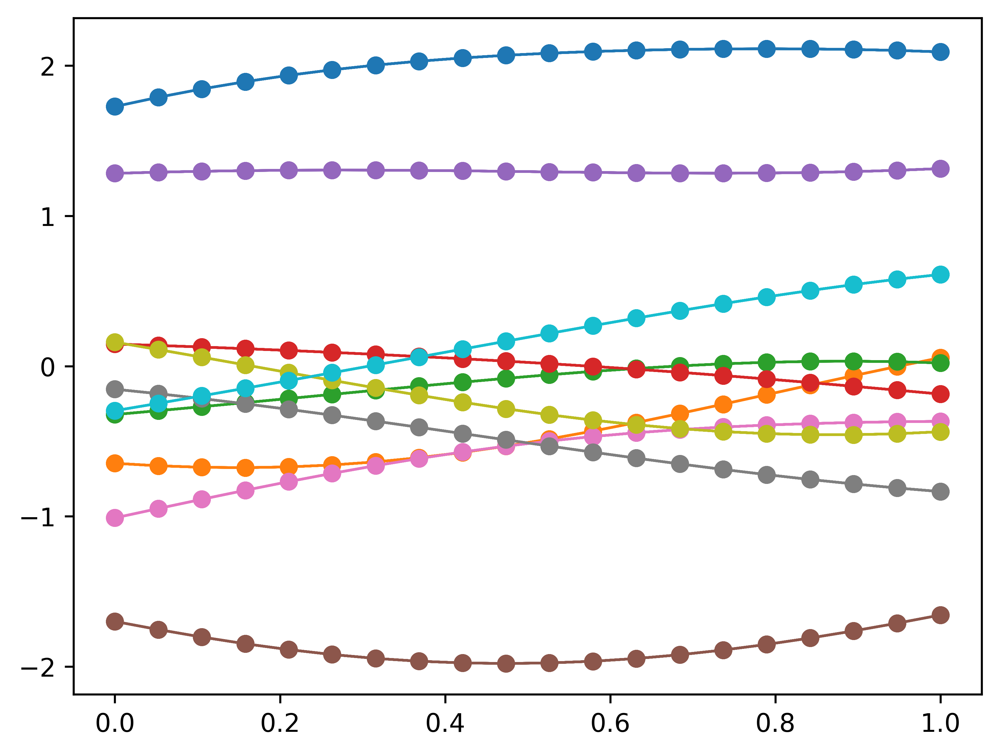

In [13]:
n = 20
m = 10

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

K_ = kernel(Xshow, Xshow)                  # k(x_star, x_star)

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, K_, m).T

plt.clf()

Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

for i in range(m):
    plt.plot(Xshow, f_prior, '-o', linewidth=1)

# plt.title('10 samples of the 20-D gaussian kernelized prior')
# plt.show()
plt.savefig('20d_gaussian_kernel_prior')

We get much smoother lines and looks even more like functions. When the dimension of Gaussian gets larger, there is no need to connect points. When the dimension become infinity, there is a point represents any possible input. Let's plot `m=200` samples of `n=200`$-D$ Gaussian to get a feeling of functions with infinity parameters.  

<Figure size 3840x2880 with 0 Axes>

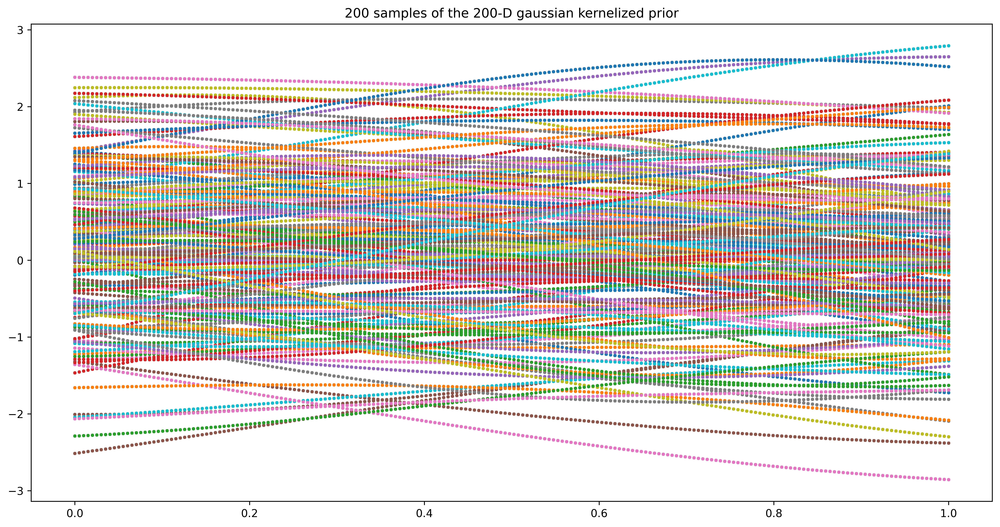

In [14]:
n = 200
m = 200

Xshow = np.linspace(0, 1, n).reshape(-1,1)

K_ = kernel(Xshow, Xshow)                    # k(x_star, x_star)

mean = np.zeros(n)
cov = np.eye(n)

f_prior = np.random.multivariate_normal(mean, K_, m).T

plt.clf()
#plt.plot(Xshow, f_prior, '-o')
Xshow = np.linspace(0, 1, n).reshape(-1,1)   # n number test points in the range of (0, 1)

plt.figure(figsize=(16,8))
for i in range(m):
    plt.plot(Xshow, f_prior, 'o', linewidth=1, markersize=2, markeredgewidth=1)

plt.title('200 samples of the 200-D gaussian kernelized prior')
#plt.axis([0, 1, -3, 3])
plt.show()
#plt.savefig('priorT.png', bbox_inches='tight', dpi=300)

As we can see above, when we increase the dimension of Gaussian to infinity, we can sample all the possible points in our region of interest.

A great visualization animation of two and four points covariance of the "functions" respectively.

<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/2points_covariance.gif?raw=1" width="600"/>
      	  
<img src="https://github.com/jwangjie/Gaussian-Process-be-comfortable-using-it/blob/master/img/4points_covariance.gif?raw=1" width="600"/>

To generate correlated normally distributed random samples, one can first generate uncorrelated samples, and then multiply them
by a matrix *L* such that $L L^T = K$, where *K* is the desired covariance matrix. *L* can be created, for example, by using
the Cholesky decomposition of *K*.

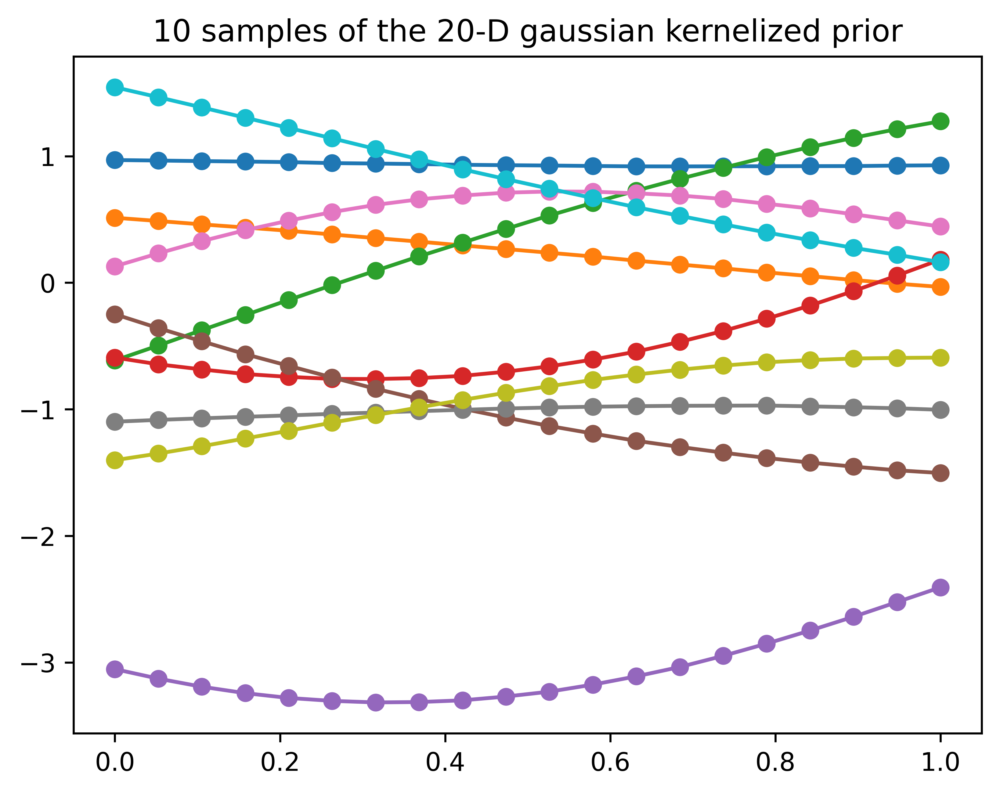

In [15]:
n = 20
m = 10

Xshow = np.linspace(0, 1, n).reshape(-1,1)  # n number test points in the range of (0, 1)

K_ = kernel(Xshow, Xshow)

L = np.linalg.cholesky(K_ + 1e-6*np.eye(n))


f_prior = np.dot(L, np.random.normal(size=(n,m)))

plt.clf()
plt.plot(Xshow, f_prior, '-o')
plt.title('10 samples of the 20-D gaussian kernelized prior')
plt.show()

## III. Simple Implementation Example

We do the regression example between -5 and 5. The observation data points (traing dataset) are generated from a uniform distribution between -5 and 5. This means any point value within the given interval [-5, 5] is equally likely to be drawn by uniform. The functions will be evaluated at `n` evenly spaced points between -5 and 5. We do this to show a continuous function for regression in our region of interest [-5, 5]. This is a simple example to do GP regression. It assumes a zero mean GP Prior. The code borrows heavily from Dr. Nando de Freitas’ Gaussian processes for nonlinear regression [lecture](https://youtu.be/4vGiHC35j9s).

In [16]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

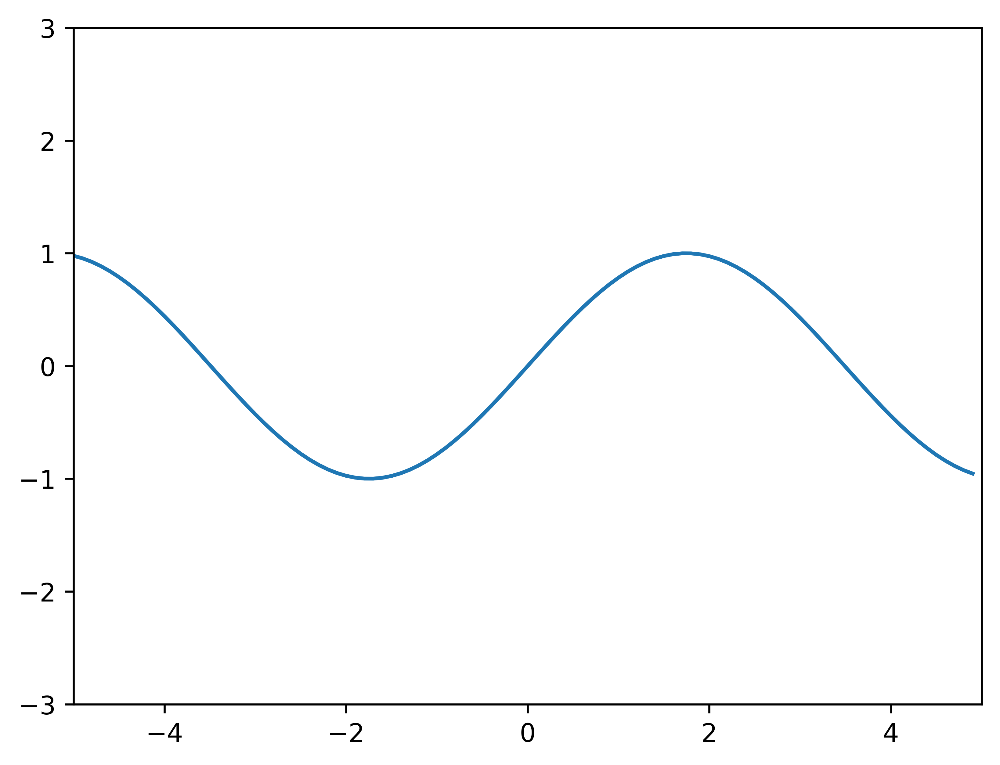

In [17]:
# This is the true unknown function we are trying to approximate
f = lambda x: np.sin(0.9*x).flatten()
#f = lambda x: (0.25*(x**2)).flatten()
x = np.arange(-5, 5, 0.1)

plt.plot(x, f(x))
plt.axis([-5, 5, -3, 3])
plt.show()

In [18]:
# Define the kernel
def kernel(a, b):
    kernelParameter_l = 0.1
    kernelParameter_sigma = 1.0
    sqdist = np.sum(a**2,axis=1).reshape(-1,1) + np.sum(b**2,1) - 2*np.dot(a, b.T)
    # np.sum( ,axis=1) means adding all elements columnly; .reshap(-1, 1) add one dimension to make (n,) become (n,1)
    return kernelParameter_sigma*np.exp(-.5 * (1/kernelParameter_l) * sqdist)

We use a general Squared Exponential Kernel, also called Radial Basis Function Kernel or Gaussian Kernel:

$$
\kappa(\mathbf{x}_i,\mathbf{x}_j) = \sigma_f^2 \exp(-\frac{1}{2l^2}
  (\mathbf{x}_i - \mathbf{x}_j)^T
  (\mathbf{x}_i - \mathbf{x}_j))
$$

where $\sigma_f$ and $l$ are hyperparameters. More information about the hyperparameters can be found after the codes.

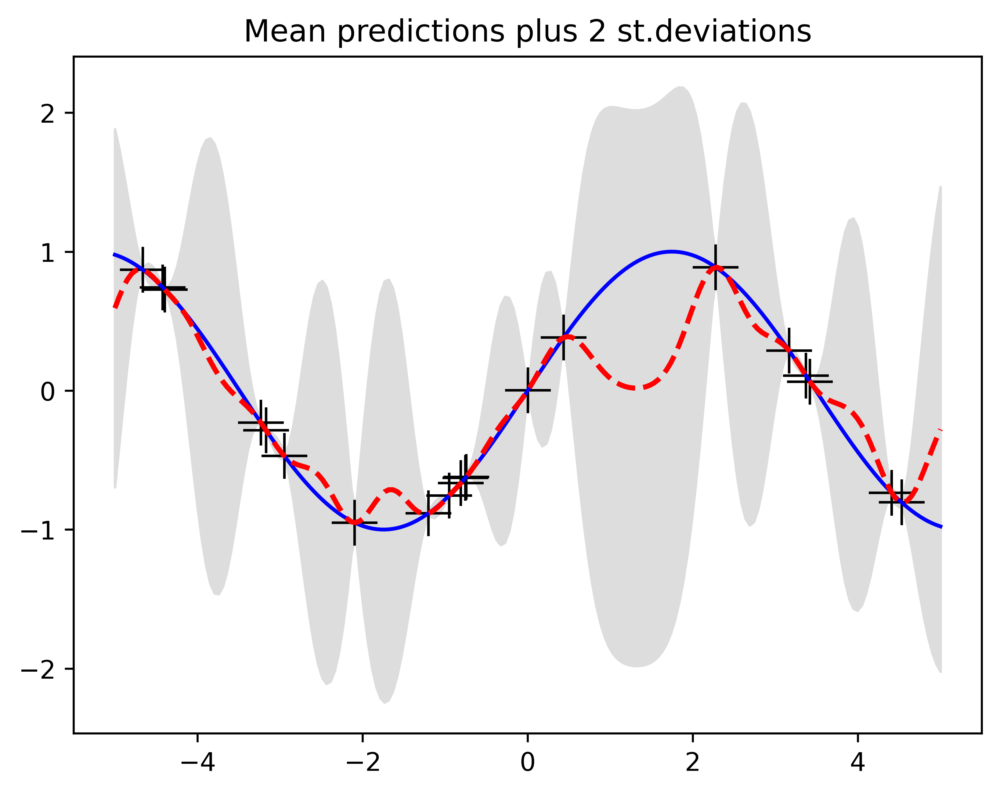

In [19]:
# Sample some input points and noisy versions of the function evaluated at
# these points.
N = 20         # number of existing observation points (training points).
n = 200        # number of test points.
s = 0.00005    # noise variance.

X = np.random.uniform(-5, 5, size=(N,1))     # N training points
y = f(X) + s*np.random.randn(N)

K = kernel(X, X)
L = np.linalg.cholesky(K + s*np.eye(N))     # line 1

# points we're going to make predictions at.
Xtest = np.linspace(-5, 5, n).reshape(-1,1)

# compute the mean at our test points.
Lk = np.linalg.solve(L, kernel(X, Xtest))   # k_star = kernel(X, Xtest), calculating v := l\k_star
mu = np.dot(Lk.T, np.linalg.solve(L, y))    # \alpha = np.linalg.solve(L, y)

# compute the variance at our test points.
K_ = kernel(Xtest, Xtest)                  # k(x_star, x_star)
s2 = np.diag(K_) - np.sum(Lk**2, axis=0)
s = np.sqrt(s2)

# PLOTS:
plt.figure(1)
plt.clf()
plt.plot(X, y, 'k+', ms=18)
plt.plot(Xtest, f(Xtest), 'b-')
plt.gca().fill_between(Xtest.flat, mu-2*s, mu+2*s, color="#dddddd")
plt.plot(Xtest, mu, 'r--', lw=2)
#plt.savefig('predictive.png', bbox_inches='tight', dpi=300)
plt.title('Mean predictions plus 2 st.deviations')
plt.show()
#plt.axis([-5, 5, -3, 3])

<Figure size 3840x2880 with 0 Axes>

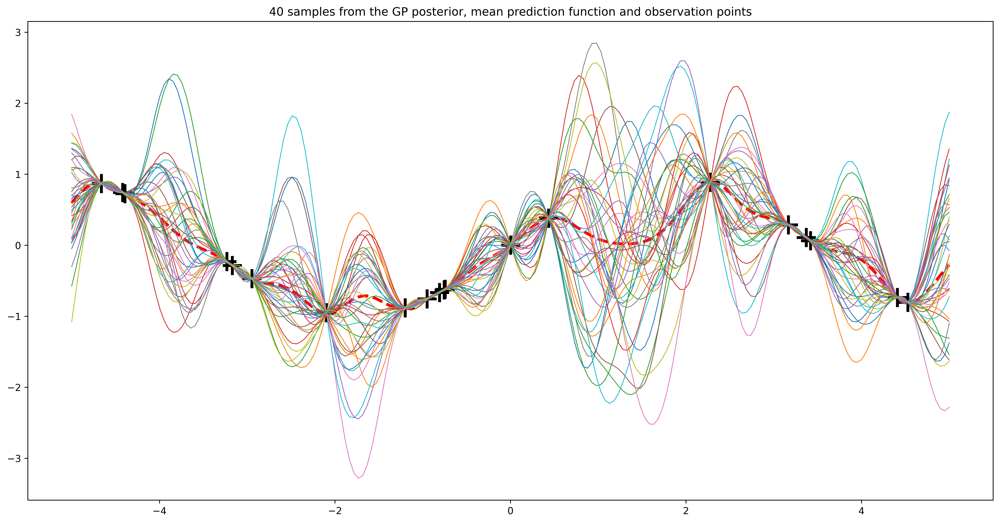

In [20]:
# draw samples from the posterior at our test points.
L = np.linalg.cholesky(K_ + 1e-6*np.eye(n) - np.dot(Lk.T, Lk))
f_post = mu.reshape(-1,1) + np.dot(L, np.random.normal(size=(n,40)))  # size=(n, m), m shown how many posterior
plt.figure(3)
plt.clf()
plt.figure(figsize=(18,9))
plt.plot(X, y, 'k+', markersize=20, markeredgewidth=3)
plt.plot(Xtest, mu, 'r--', linewidth=3)
plt.plot(Xtest, f_post, linewidth=0.8)
plt.title('40 samples from the GP posterior, mean prediction function and observation points')
plt.show()
#plt.axis([-5, 5, -3, 3])
#plt.savefig('post.png', bbox_inches='tight', dpi=600)

We plotted `m=40` samples from the Gaussian Process posterior together with the mean function for prediction and the observation data points (training dataset). It's clear all posterior functions collapse at all observation points.